<div align="center">

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/6a/Sbu-logo.svg/1200px-Sbu-logo.svg.png" width="600" height="600">
</div>

<h1 align="center"> Digital Image Processing </h1>
<h2 align="center">First Section </h2>
<h5 align="center">Mobin Nesari</h5>

# First Task:

## Face detection:

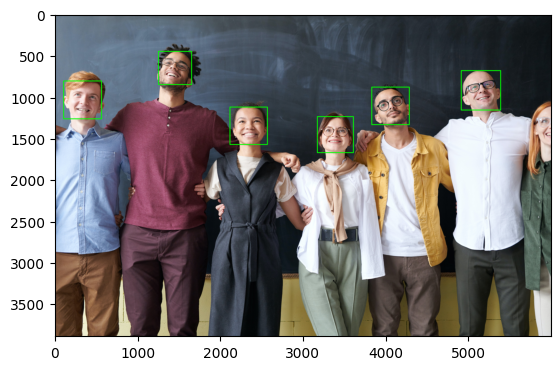

In [95]:
import cv2
import matplotlib.pyplot as plt
import copy
import numpy as np

# Load the input image
image = cv2.imread('image1.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Load the face detection cascade classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Detect faces in the grayscale image
faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.1, minNeighbors=5, minSize=[350, 350])

# Draw rectangles around the detected faces
face_images = []
for (x, y, w, h) in faces:
    blank_image = np.zeros((w, h, 3), np.uint8)
    for i in range(w):
        for j in range(h):
            blank_image[i][j] = image[y+i][x+j]
    face_images.append(copy.deepcopy(blank_image))
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 10)

# Display the output image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))


Number of face images: 6


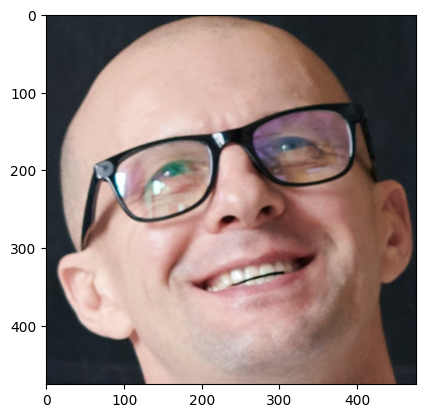

In [96]:
print(f'Number of face images: {len(face_images)}')
for i, img in enumerate(face_images):
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

## Vertical Mirror Effect

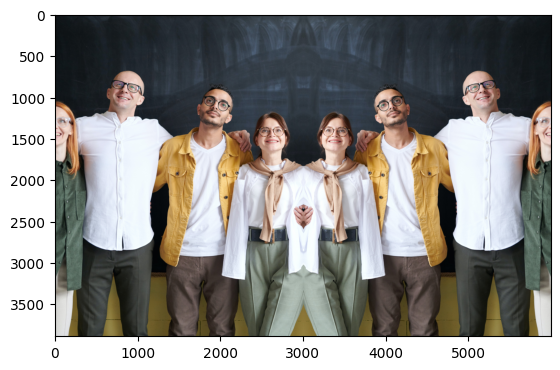

In [97]:
import numpy as np
import pandas as pd
import copy
import cv2
import matplotlib.pyplot as plt

image = cv2.imread('image1.jpg')
flip_image = copy.deepcopy(image)

width = image.shape[1] - 1

for i in range(image.shape[1] // 2):
    flip_image[:, i], flip_image[:, width - i] = flip_image[:, width - i], flip_image[:, i]

plt.imshow(cv2.cvtColor(flip_image, cv2.COLOR_BGR2RGB))

## Horizontal Mirror Effect

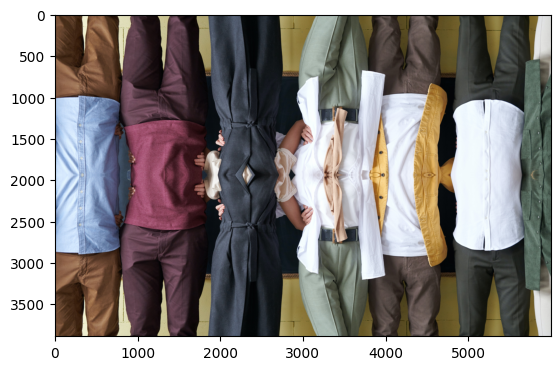

In [98]:
flip_image = copy.deepcopy(image)

height = image.shape[0] - 1

for i in range(image.shape[0] // 2):
    flip_image[i, :], flip_image[height - i, :] = flip_image[height - i, :], flip_image[i, :]

plt.imshow(cv2.cvtColor(flip_image, cv2.COLOR_BGR2RGB))

## Vertical Flip

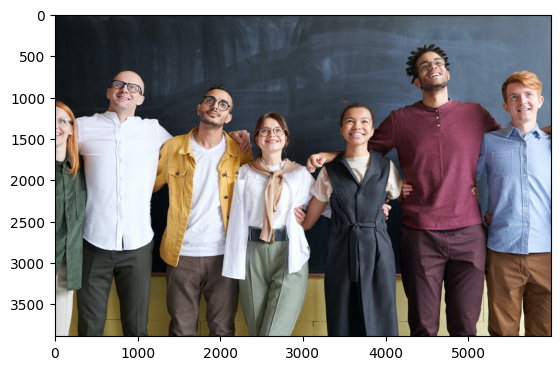

In [99]:
flip_image = copy.deepcopy(image)

width = image.shape[1] - 1

for i in range(image.shape[1]):
    flip_image[:, i], flip_image[:, width - i] = image[:, width - i], image[:, i]

plt.imshow(cv2.cvtColor(flip_image, cv2.COLOR_BGR2RGB))

## Horizontal Flip

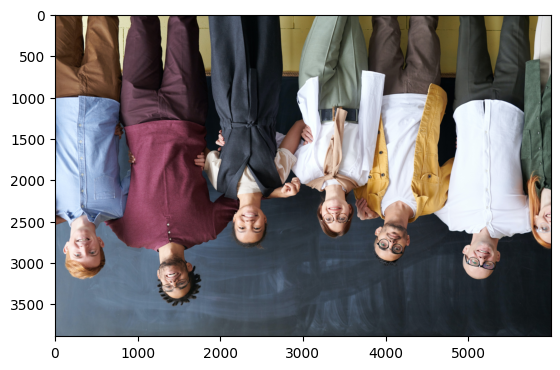

In [100]:
flip_image = copy.deepcopy(image)

height = image.shape[0] - 1

for i in range(image.shape[0]):
    flip_image[i, :], flip_image[height - i, :] = image[height - i, :], image[i, :]

plt.imshow(cv2.cvtColor(flip_image, cv2.COLOR_BGR2RGB))

## Mirroring

In [9]:
def mirror_image(img):
    # Get the width and height of the image
    height, width = img.shape[:2]

    # Create an empty output image with the same dimensions as the input image
    mirrored_img = np.zeros((height, width, 3), dtype=np.uint8)

    # Mirror the input image horizontally by copying each row in reverse order
    for y in range(height):
        for x in range(width):
            mirrored_img[y, x] = img[y, width - 1 - x]
    return mirrored_img

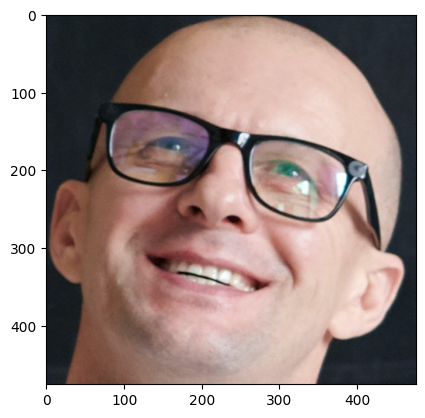

In [101]:
mirrored_faces = []
for img in face_images:
    mirrored_faces.append(mirror_image(img))

plt.imshow(cv2.cvtColor(mirrored_faces[-1], cv2.COLOR_BGR2RGB))

(3886, 5999, 3)
(3887, 6000, 3)


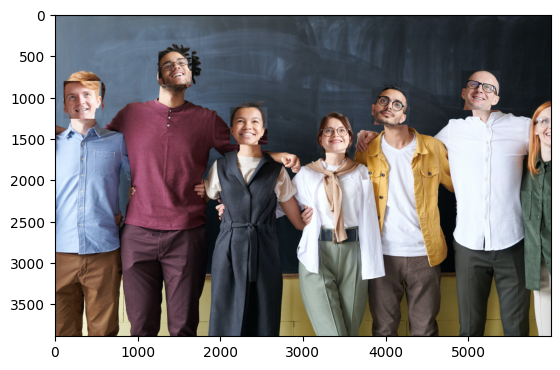

In [102]:
mirrored_image = np.zeros((height, width, 3), dtype=np.uint8)
print(mirrored_image.shape)
print(image.shape)
for i in range(width):
    for j in range(height):
        mirrored_image[j][i] = image[j][i]

counter = 0
for (x, y, w, h) in faces:
    for i in range(w):
        for j in range(h):
            mirrored_image[y + i][x + j] = mirrored_faces[counter][i][j]
    counter += 1

plt.imshow(cv2.cvtColor(mirrored_image, cv2.COLOR_BGR2RGB))

## Horizontal Flip

In [83]:
def horizontal_flip(input_image):
    image = copy.deepcopy(input_image)
    height = image.shape[0]
    width = image.shape[1]
    flip_image = np.zeros((height, width, 3), dtype=np.uint8)

    for i in range(image.shape[0]):
        flip_image[i, :], flip_image[height - i - 1, :] = image[height - i - 1, :], image[i, :]
    
    return flip_image

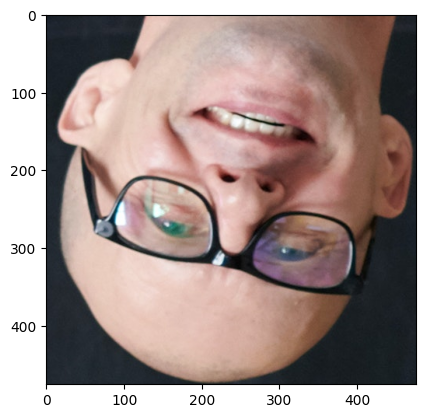

In [103]:
flip_faces = []
for img in face_images:
    flip_faces.append(horizontal_flip(img))

plt.imshow(cv2.cvtColor(flip_faces[-1], cv2.COLOR_BGR2RGB))

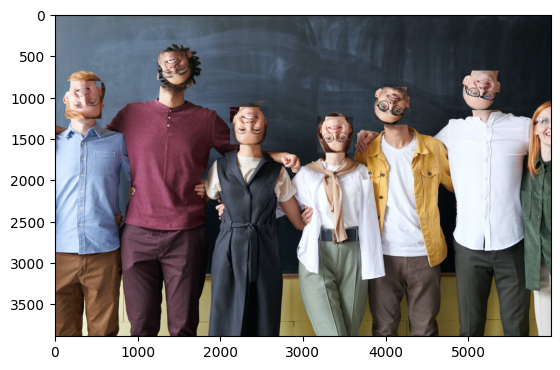

In [104]:
flip_image = np.zeros((height, width, 3), dtype=np.uint8)
for i in range(width):
    for j in range(height):
        flip_image[j][i] = image[j][i]

counter = 0
for (x, y, w, h) in faces:
    for i in range(w):
        for j in range(h):
            flip_image[y + i][x + j] = flip_faces[counter][i][j]
    counter += 1

plt.imshow(cv2.cvtColor(flip_image, cv2.COLOR_BGR2RGB))

### Rotate Faces by 45 degree

In [105]:
def rotate_image(input_image):
    img = copy.deepcopy(input_image)
    
    # Get the height and width of the image
    (h, w) = img.shape[:2]
    
    # Calculate the center of the image
    center = (w // 2, h // 2)
    
    # Define the rotation angle in degrees
    angle = 45
    
    # Define the scale factor for the rotation
    scale = 1.0
    
    # Calculate the rotation matrix using the center, angle, and scale
    M = cv2.getRotationMatrix2D(center, angle, scale)
    
    # Apply the rotation to the image
    rotated = cv2.warpAffine(img, M, (w, h), cv2.INTER_NEAREST)
    
    return rotated

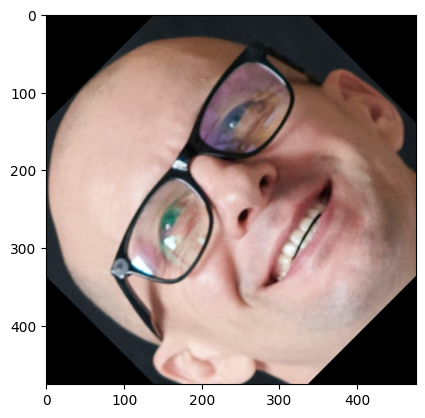

In [106]:
rotate_faces = []
for img in face_images:
    rotate_faces.append(rotate_image(img))

plt.imshow(cv2.cvtColor(rotate_faces[-1], cv2.COLOR_BGR2RGB))

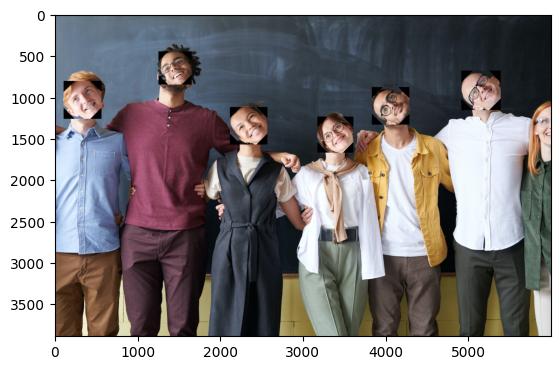

In [107]:
rotate_img = np.zeros((height, width, 3), dtype=np.uint8)
for i in range(width):
    for j in range(height):
        rotate_img[j][i] = image[j][i]

counter = 0
for (x, y, w, h) in faces:
    for i in range(w):
        for j in range(h):
            rotate_img[y + i][x + j] = rotate_faces[counter][i][j]
    counter += 1

plt.imshow(cv2.cvtColor(rotate_img, cv2.COLOR_BGR2RGB))

# Second Task

### Benchmark Picture:

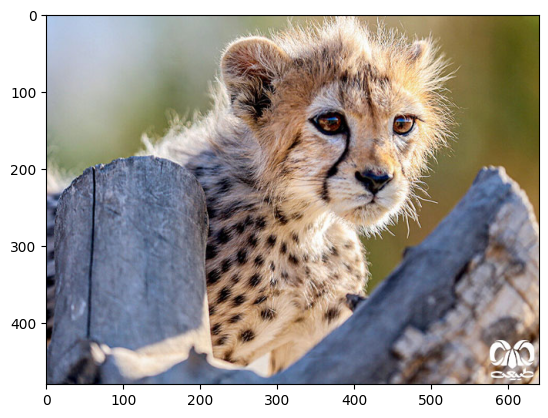

In [109]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

benchmark_image = cv2.imread("image2.jpg")
benchmark_image = cv2.cvtColor(benchmark_image, cv2.COLOR_BGR2RGB)
plt.imshow(benchmark_image)

### RGB Indexer:

In [41]:
def image_indexer_RGB(path: str, num_clusters: int):

    # Load the image
    img = cv2.imread(path)

    # Split the image into blue, green and red channels
    blue, green, red = cv2.split(img)

    # Flatten each channel into a 1D array
    blue_1d = blue.reshape(-1)
    green_1d = green.reshape(-1)
    red_1d = red.reshape(-1)

    # Combine the 1D arrays into a single 2D array where each row represents a pixel
    pixels = np.column_stack((blue_1d, green_1d, red_1d))

    # Create a KMeans object and fit it to the pixel data
    kmeans = KMeans(n_clusters=num_clusters).fit(pixels)

    # Get the labels assigned to each pixel by the k-means algorithm
    labels = kmeans.labels_

    # Reshape the label array into the original image shape
    label_img = labels.reshape(img.shape[0], img.shape[1])

    # Convert the label image to an indexed color image
    indexed_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    for i in range(num_clusters):
        # Find all pixels belonging to this cluster
        mask = (label_img == i)
        # Assign them the average color of the cluster
        indexed_img[mask] = np.array(kmeans.cluster_centers_[i], dtype=np.uint8)

    # Display the new indexed color image
    plt.imshow(cv2.cvtColor(indexed_img, cv2.COLOR_BGR2RGB))
    return indexed_img


----------Iteration: 1----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


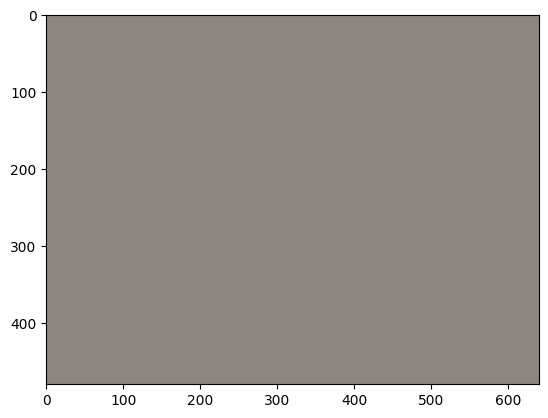

----------Iteration: 11----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


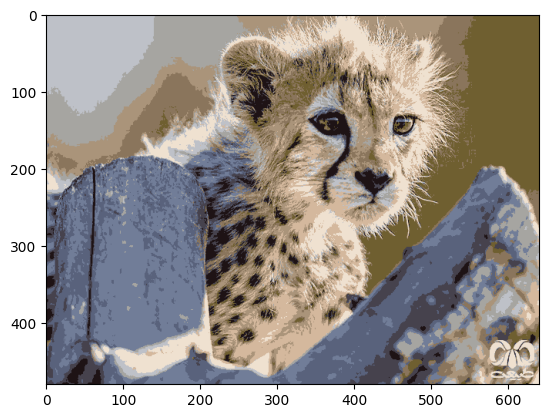

----------Iteration: 21----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


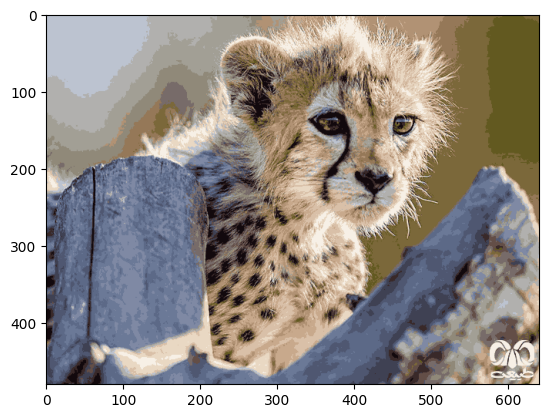

----------Iteration: 31----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


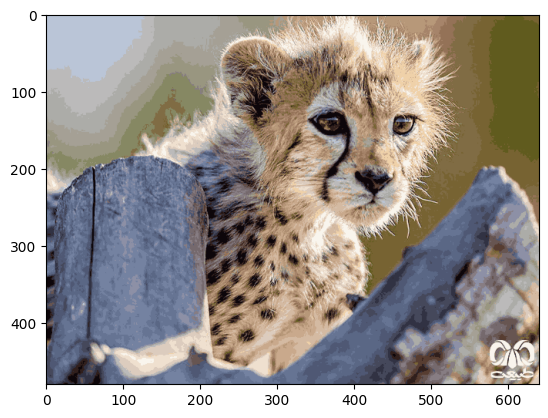

----------Iteration: 41----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


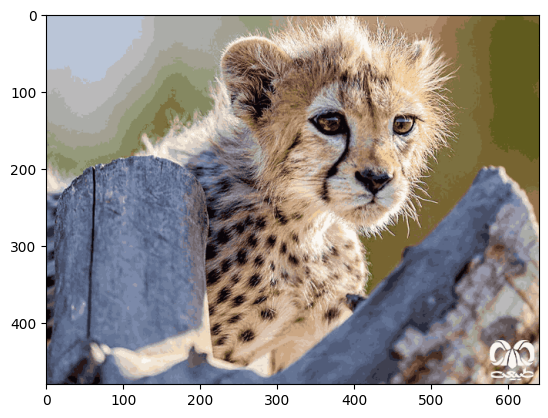

In [50]:
path = "image2.jpg"

for i in range(1, 42, 10):
  print("-"*10 + f'Iteration: {i}' + '-'*10)
  plt.figure()
  image_indexer_RGB(path, i)
  plt.show()

### RGB -> HSV -> RGB :

In [55]:
def image_indexer_hsv(path: str, num_clusters: int):

    # Load the image
    img = cv2.imread(path)

    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Split the image into hue, saturation and value channels
    hue, saturation, value = cv2.split(hsv_img)

    # Flatten each channel into a 1D array
    hue_1d = hue.reshape(-1)
    saturation_1d = saturation.reshape(-1)
    value_1d = value.reshape(-1)

    # Combine the 1D arrays into a single 2D array where each row represents a pixel
    pixels = np.column_stack((hue_1d, saturation_1d, value_1d))

    # Create a KMeans object and fit it to the pixel data
    kmeans = KMeans(n_clusters=num_clusters).fit(pixels)

    # Get the labels assigned to each pixel by the k-means algorithm
    labels = kmeans.labels_

    # Reshape the label array into the original image shape
    label_img = labels.reshape(img.shape[0], img.shape[1])

    # Convert the label image to an indexed color image
    indexed_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    for i in range(num_clusters):
        # Find all pixels belonging to this cluster
        mask = (label_img == i)
        # Assign them the average color of the cluster
        indexed_img[mask] = np.array(kmeans.cluster_centers_[i], dtype=np.uint8)

    # Display the new indexed color image
    plt.imshow(cv2.cvtColor(indexed_img, cv2.COLOR_HSV2RGB))
    return indexed_img

----------Iteration: 1----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


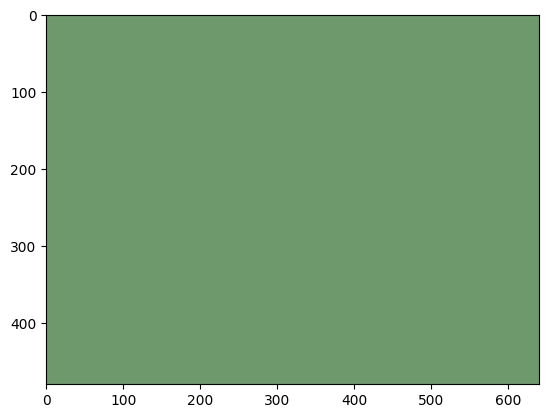

----------Iteration: 11----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


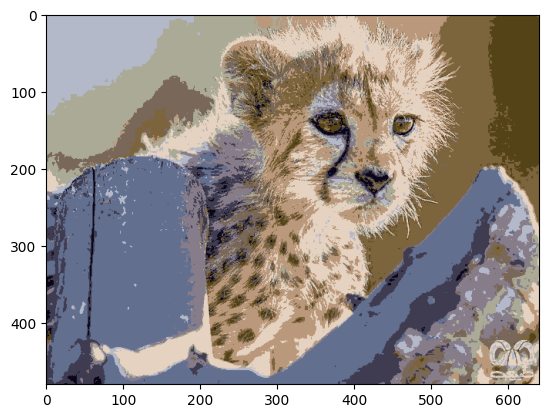

----------Iteration: 21----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


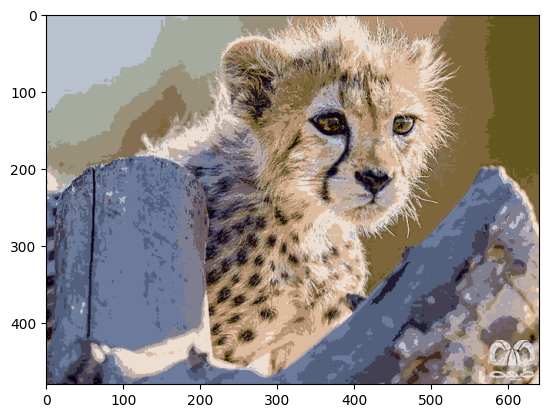

----------Iteration: 31----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


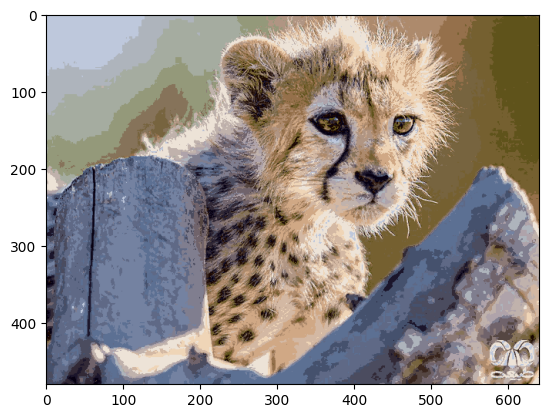

----------Iteration: 41----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


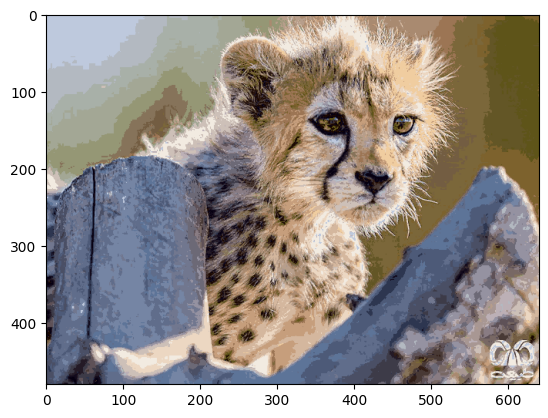

In [56]:
path = "image2.jpg"

for i in range(1, 42, 10):
  print("-"*10 + f'Iteration: {i}' + '-'*10)
  plt.figure()
  image_indexer_hsv(path, i)
  plt.show()

### RGB -> YCrCb -> RGB :

In [59]:
def image_indexer_YCrCb(path: str, num_clusters: int):

    # Load the image
    img = cv2.imread(path)

    lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

    # Split the image into Y, Cr and Cb channels
    Y, Cr, Cb = cv2.split(lab_img)

    # Flatten each channel into a 1D array
    Y_1d = Y.reshape(-1)
    Cr_1d = Cr.reshape(-1)
    Cb_1d = Cb.reshape(-1)

    # Combine the 1D arrays into a single 2D array where each row represents a pixel
    pixels = np.column_stack((Y_1d, Cr_1d, Cb_1d))

    # Create a KMeans object and fit it to the pixel data
    kmeans = KMeans(n_clusters=num_clusters).fit(pixels)

    # Get the labels assigned to each pixel by the k-means algorithm
    labels = kmeans.labels_

    # Reshape the label array into the original image shape
    label_img = labels.reshape(img.shape[0], img.shape[1])

    # Convert the label image to an indexed color image
    indexed_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    for i in range(num_clusters):
        # Find all pixels belonging to this cluster
        mask = (label_img == i)
        # Assign them the average color of the cluster
        indexed_img[mask] = np.array(kmeans.cluster_centers_[i], dtype=np.uint8)

    # Display the new indexed color image
    plt.imshow(cv2.cvtColor(indexed_img, cv2.COLOR_YCrCb2RGB))
    return indexed_img

----------Iteration: 1----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


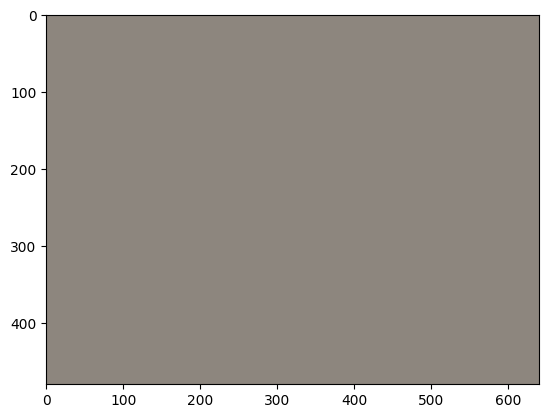

----------Iteration: 11----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


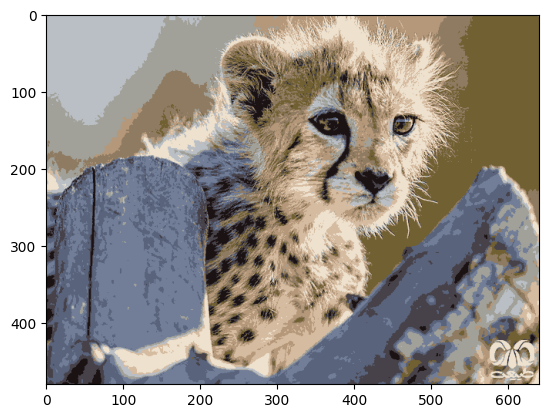

----------Iteration: 21----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


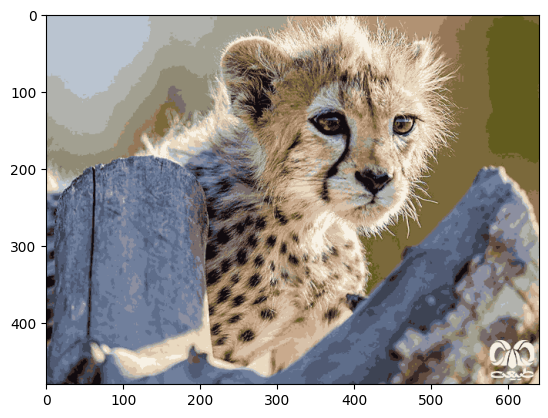

----------Iteration: 31----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


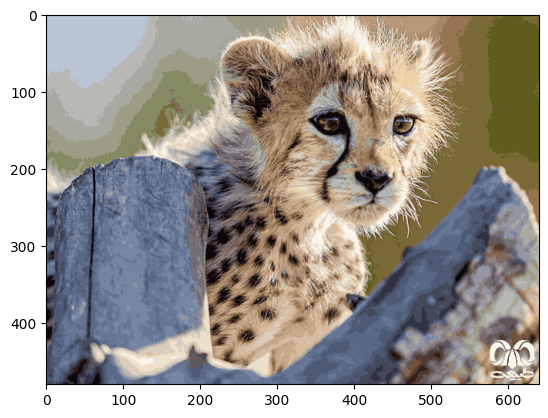

----------Iteration: 41----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


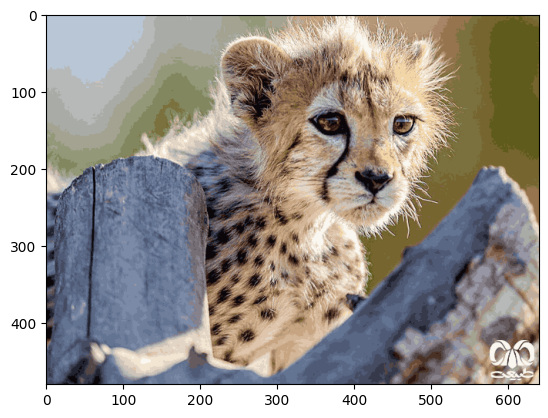

In [60]:
path = "image2.jpg"

for i in range(1, 42, 10):
  print("-"*10 + f'Iteration: {i}' + '-'*10)
  plt.figure()
  image_indexer_YCrCb(path, i)
  plt.show()

### RGB -> LAB -> RGB :

In [61]:
def image_indexer_LAB(path: str, num_clusters: int):

    # Load the image
    img = cv2.imread(path)

    lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)

    # Split the image into L, A and B channels
    L, A, B = cv2.split(lab_img)

    # Flatten each channel into a 1D array
    L_1d = L.reshape(-1)
    A_1d = A.reshape(-1)
    B_1d = B.reshape(-1)

    # Combine the 1D arrays into a single 2D array where each row represents a pixel
    pixels = np.column_stack((L_1d, A_1d, B_1d))

    # Create a KMeans object and fit it to the pixel data
    kmeans = KMeans(n_clusters=num_clusters).fit(pixels)

    # Get the labels assigned to each pixel by the k-means algorithm
    labels = kmeans.labels_

    # Reshape the label array into the original image shape
    label_img = labels.reshape(img.shape[0], img.shape[1])

    # Convert the label image to an indexed color image
    indexed_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    for i in range(num_clusters):
        # Find all pixels belonging to this cluster
        mask = (label_img == i)
        # Assign them the average color of the cluster
        indexed_img[mask] = np.array(kmeans.cluster_centers_[i], dtype=np.uint8)

    # Display the new indexed color image
    plt.imshow(cv2.cvtColor(indexed_img, cv2.COLOR_Lab2RGB))
    return indexed_img

----------Iteration: 1----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


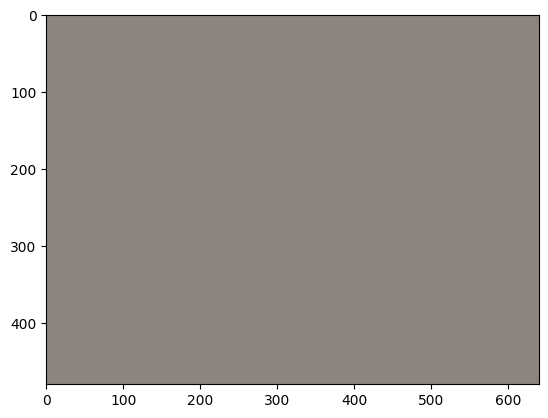

----------Iteration: 11----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


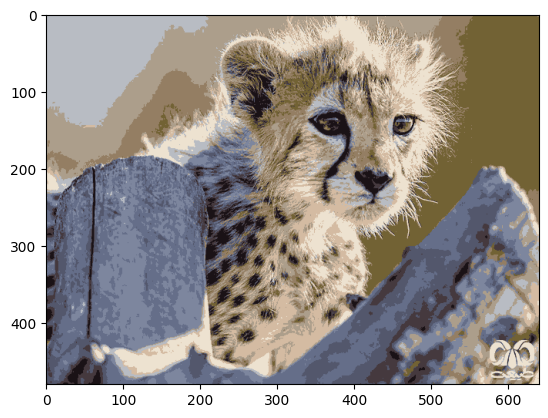

----------Iteration: 21----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


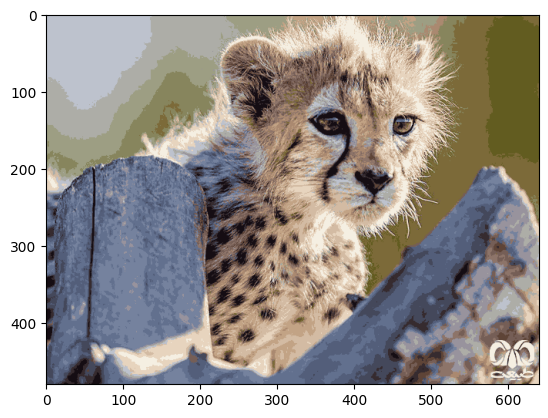

----------Iteration: 31----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


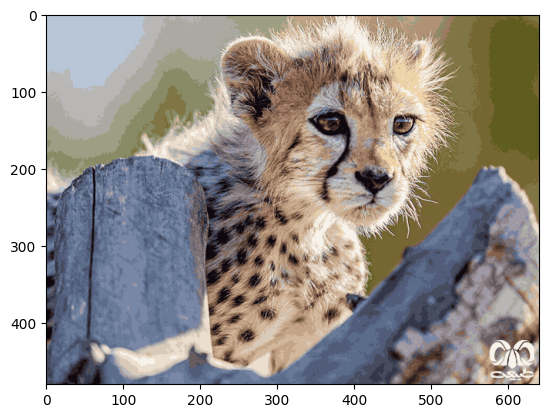

----------Iteration: 41----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


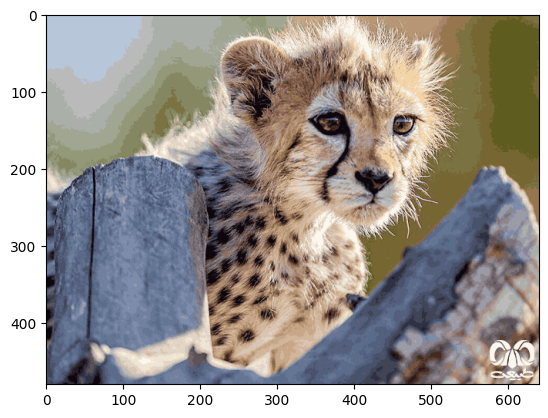

In [62]:
path = "image2.jpg"

for i in range(1, 42, 10):
  print("-"*10 + f'Iteration: {i}' + '-'*10)
  plt.figure()
  image_indexer_LAB(path, i)
  plt.show()

### RGB -> XYZ -> RGB :

In [65]:
def image_indexer_XYZ(path: str, num_clusters: int):

    # Load the image
    img = cv2.imread(path)

    xyz_img = cv2.cvtColor(img, cv2.COLOR_BGR2XYZ)

    # Split the image into X, Y and Z channels
    X, Y, Z = cv2.split(xyz_img)

    # Flatten each channel into a 1D array
    X_1d = X.reshape(-1)
    Y_1d = Y.reshape(-1)
    Z_1d = Z.reshape(-1)

    # Combine the 1D arrays into a single 2D array where each row represents a pixel
    pixels = np.column_stack((X_1d, Y_1d, Z_1d))

    # Create a KMeans object and fit it to the pixel data
    kmeans = KMeans(n_clusters=num_clusters).fit(pixels)

    # Get the labels assigned to each pixel by the k-means algorithm
    labels = kmeans.labels_

    # Reshape the label array into the original image shape
    label_img = labels.reshape(img.shape[0], img.shape[1])

    # Convert the label image to an indexed color image
    indexed_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    for i in range(num_clusters):
        # Find all pixels belonging to this cluster
        mask = (label_img == i)
        # Assign them the average color of the cluster
        indexed_img[mask] = np.array(kmeans.cluster_centers_[i], dtype=np.uint8)

    # Display the new indexed color image
    plt.imshow(cv2.cvtColor(indexed_img, cv2.COLOR_XYZ2RGB))
    return indexed_img

----------Iteration: 1----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


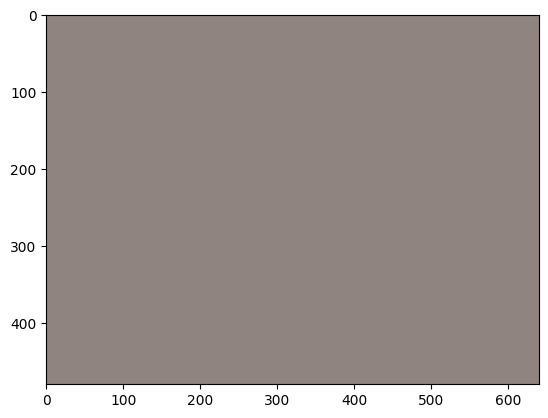

----------Iteration: 11----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


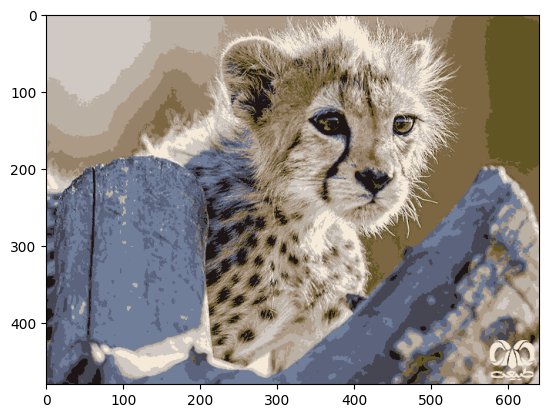

----------Iteration: 21----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


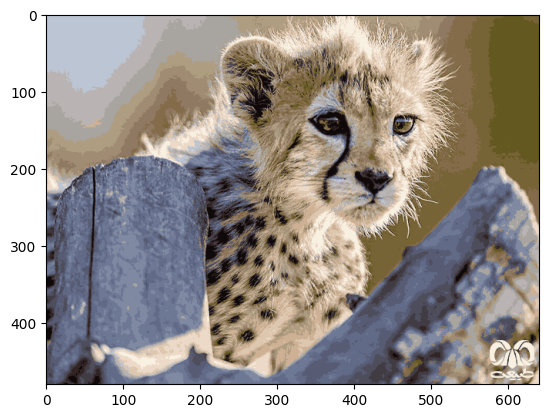

----------Iteration: 31----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


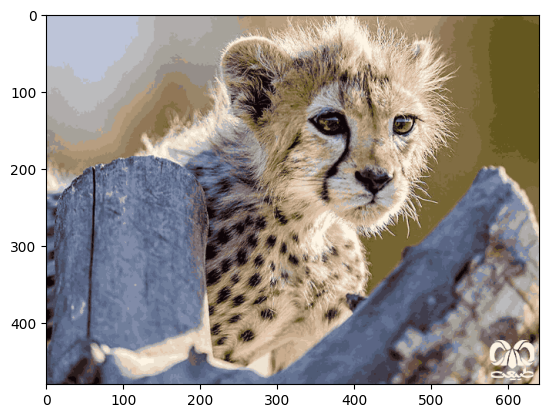

----------Iteration: 41----------


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


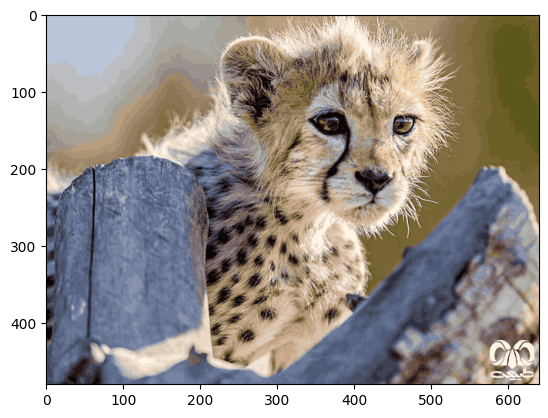

In [66]:
path = "image2.jpg"

for i in range(1, 42, 10):
  print("-"*10 + f'Iteration: {i}' + '-'*10)
  plt.figure()
  image_indexer_XYZ(path, i)
  plt.show()